# Lab Report "Demodulation" of Group 1 (Wörner, Velez, Northe)

The source code and the binaries from this report can be found in our Github [repository](https://github.com/NortheLo/Microwave_Eng_Lab/tree/main/Lab6_Analog_Digital_Mod).

### Used imports for calculations

In [31]:
import numpy as np

Helper functions:

In [32]:
db2pow: float = lambda db: np.pow(10, (db / 10))

f2omega: float = lambda f: 2 * np.pi * f

get_c_lpf = lambda omega, R: 1 / (omega * R)


def scientific_2_str(value: float, unit: str = "Ω") -> str:
    prefixes = [
        (1e9, 'G'),
        (1e6, 'M'),
        (1e3, 'k'),
        (1, ''),
        (1e-3, 'm'),
        (1e-6, 'µ'),
        (1e-9, 'n'),
        (1e-12, 'p')
    ]

    for factor, prefix in prefixes:
        if abs(value) >= factor:
            formatted = value / factor
            return f"{formatted:.3g} {prefix}{unit}"
    return f"{value:.3g} {unit}"  # fallback for very small values

## 7.1 Analog Modulation and Demodulation

### 7.1.1 Generation of an Amplitude-Modulated Signal

In this section, we analyze an amplitude-modulated (AM) signal generated by the circuit shown in **Figure 1**. The circuit implements the AM signal by modulating a high-frequency carrier signal with a lower-frequency sinusoidal message. The purpose of this setup is to observe both the time-domain waveform and its frequency-domain representation in order to extract the modulation index m.

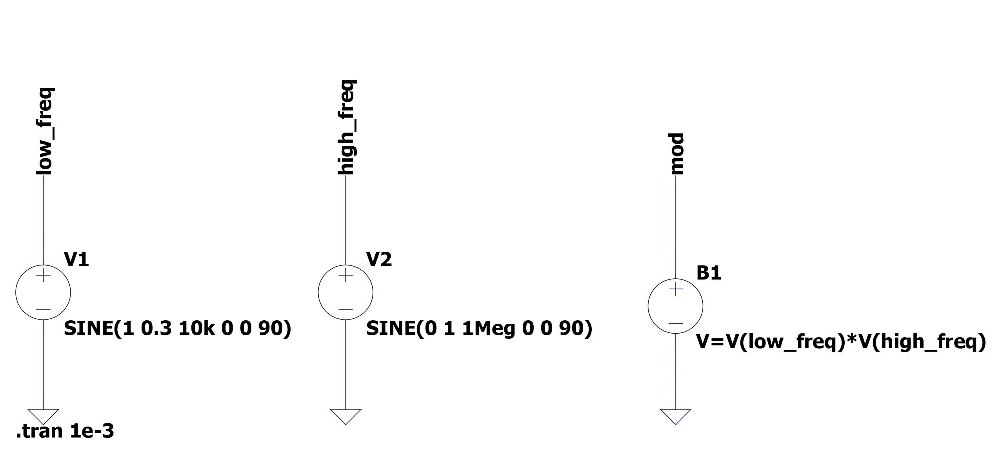
**Figure 1.** – Circuit diagram used to generate the AM signal. 
The modulator multiplies a low-frequency sinusoidal message with a high-frequency carrier, resulting in an amplitude-modulated waveform at the output node.

**Figure 2** presents the time-domain signals at key nodes of the circuit, particularly the modulated output signal. 
This figure allows us to visually verify the expected envelope shape. The envelope corresponds to the message signal, while the high-frequency oscillation corresponds to the carrier. Observing that the envelope follows a sinusoidal pattern confirms that modulation occurred correctly.

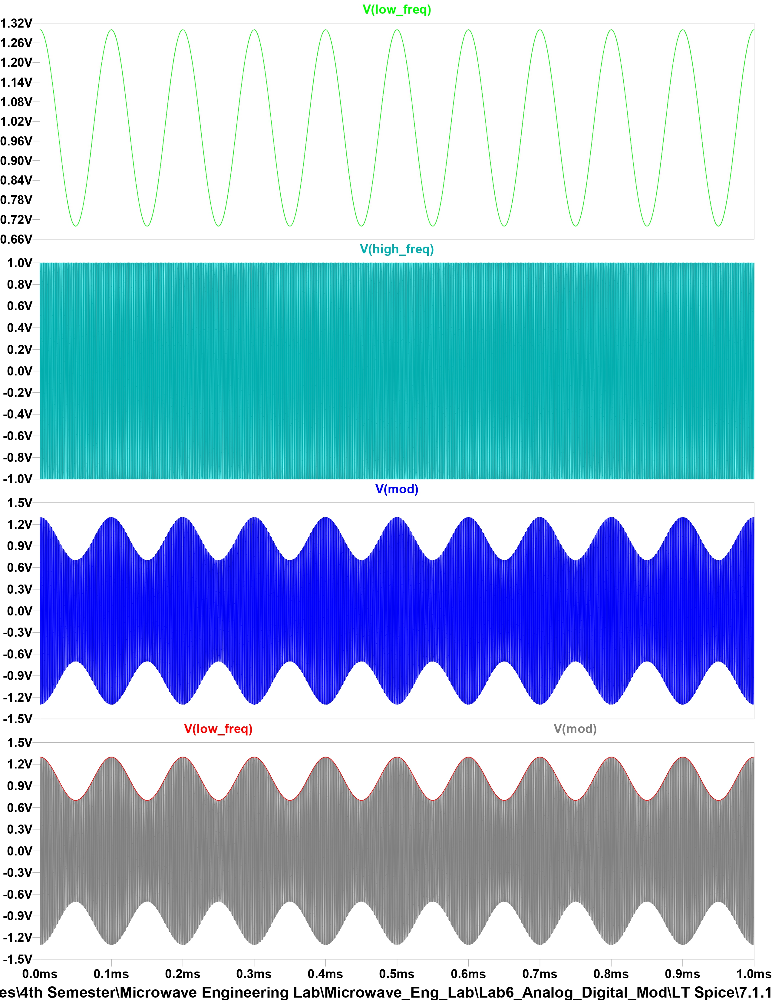  
**Figure 2.** – Time-domain signals generated by the AM circuit. 
The signal clearly shows a high-frequency carrier whose amplitude varies according to the low-frequency modulating waveform.

To quantify the modulation depth, we analyze the frequency-domain representation of the AM signal using the Fast Fourier Transform (FFT). **Figure 3** shows a zoomed-in view of the spectrum centered on the carrier frequency. We clearly observe three distinct spectral components: the carrier peak at frequency f_c, and two symmetric sidebands at \( f_c + f_m \) and \( f_c - f_m \), where \( f_m \) is the modulation frequency. The amplitude (in dB) of these components is measured directly from the FFT to estimate the power of the carrier and sidebands.

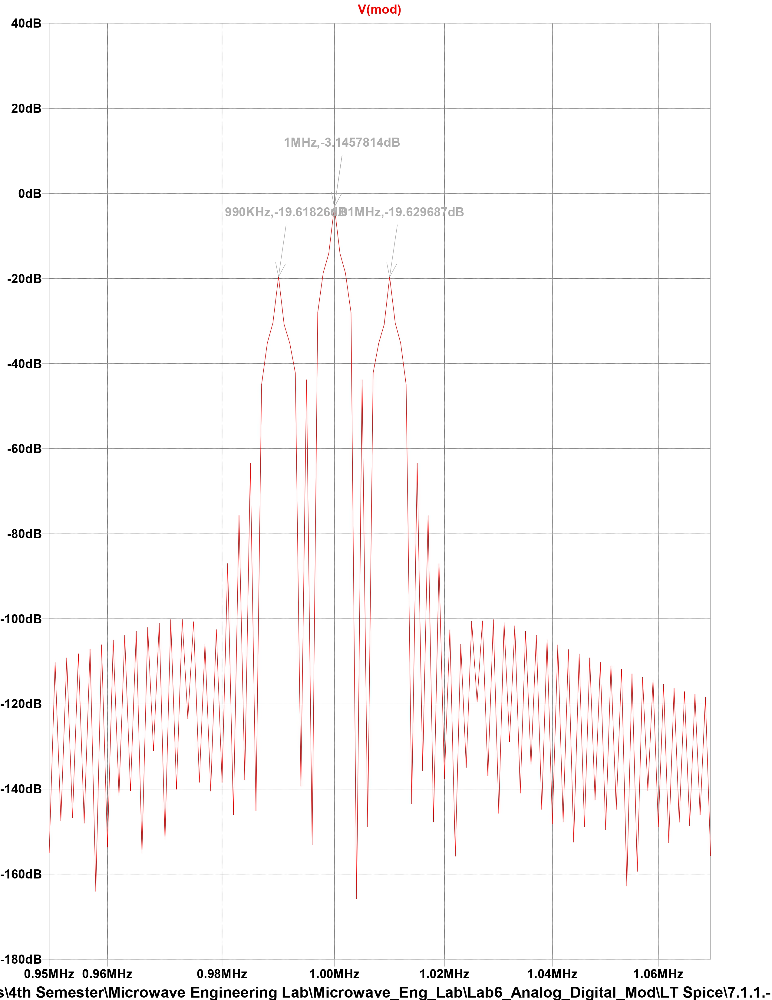  
**Figure 3.** – Zoomed-in FFT spectrum of the AM signal, showing the carrier and sidebands at ±10 kHz. These values are used to calculate the modulation index.

From the power spectrum in **Figure 3**, we extract the carrier power and the power of both sidebands, where USB and LSB refer to the upper and lower sidebands, respectively. These values are read in decibels (dB) and converted to linear scale. It is important to consider that we need to compute the amplitude of the voltage signals and not the power, hence we divide them by two befre the conversion procedure.

This method provides an accurate numerical estimate of the modulation depth. The small deviation between the calculated and theoretical modulation index is due to practical FFT limitations such as spectral leakage, finite time windows, and non-integer frequency bin alignment. Despite these, the method remains effective for estimating modulation index from simulated or measured data.

The next code cell implements this calculation.


In [33]:
pow_sb = -19.62       # [dB] power sideband
pow_sb = pow_sb + 6    # 6 instead of 3dB due to voltage   because val =( A_T*m)/2
pow_car = -3.15        # [dB] power carrier

sb_lin = db2pow(pow_sb / 2) # considers 20 instead 10 * log10
car = db2pow(pow_car / 2)

m = sb_lin / car

print(f"Modulation depth {m:.4f}")

Modulation depth 0.2996


The value is close to the expected number of m = 0.3. The small differnce is due to the limitations of the FFT algorithm to obtain the spectra. First, the use of a finite time window introduces spectral leakage, especially if the signal does not contain an integer number of periods of the carrier or modulation frequency, causing power to spread across adjacent frequency bins. Additionally, numerical precision limitations also introduce minor inaccuracies. As the modulation index is calculated from the ratio of sideband to carrier power, even small errors in these values. The windowing effect is noticeable when observing the spectra of the whole signal visible in Figure 4, as the spikes which should represent Dirac impulses are sharp rises and falls at 10kHz and 1MHz:

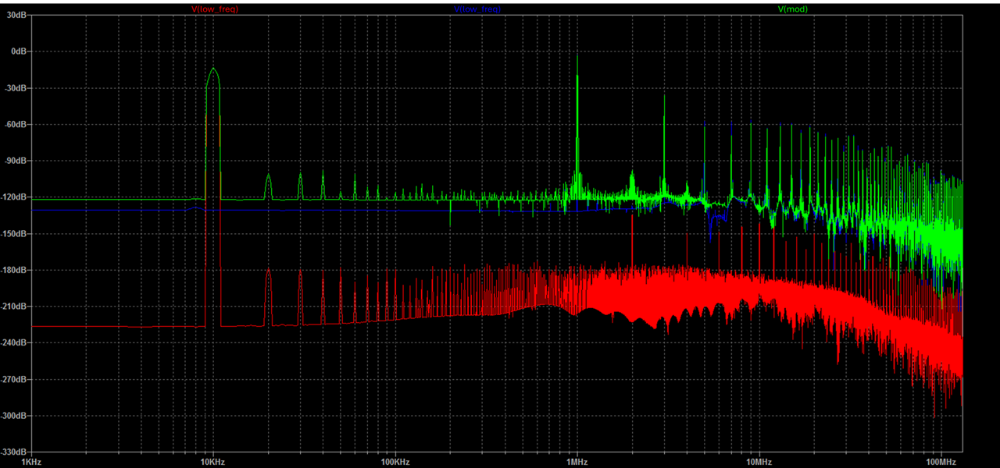
**Figure 4.** – Spectra of the generated signals where FFT limitations are visible.

We also generated a real AM signal using laboratory equipment and observed its frequency-domain representation on a spectrum analyzer. **Figure 6** shows the measured spectrum of the AM signal centered at 1 MHz. The two prominent sidebands at approximately 990 kHz and 1.010 MHz correspond to the modulation frequency of 10 kHz. The presence and symmetry of these sidebands, along with the dominant carrier peak, confirm the successful generation of a double-sideband AM signal. The measured sideband amplitudes are about –13.17 dBm, while the carrier amplitude is 2.205 dBm, which is consistent with a modulation index in the expected range.

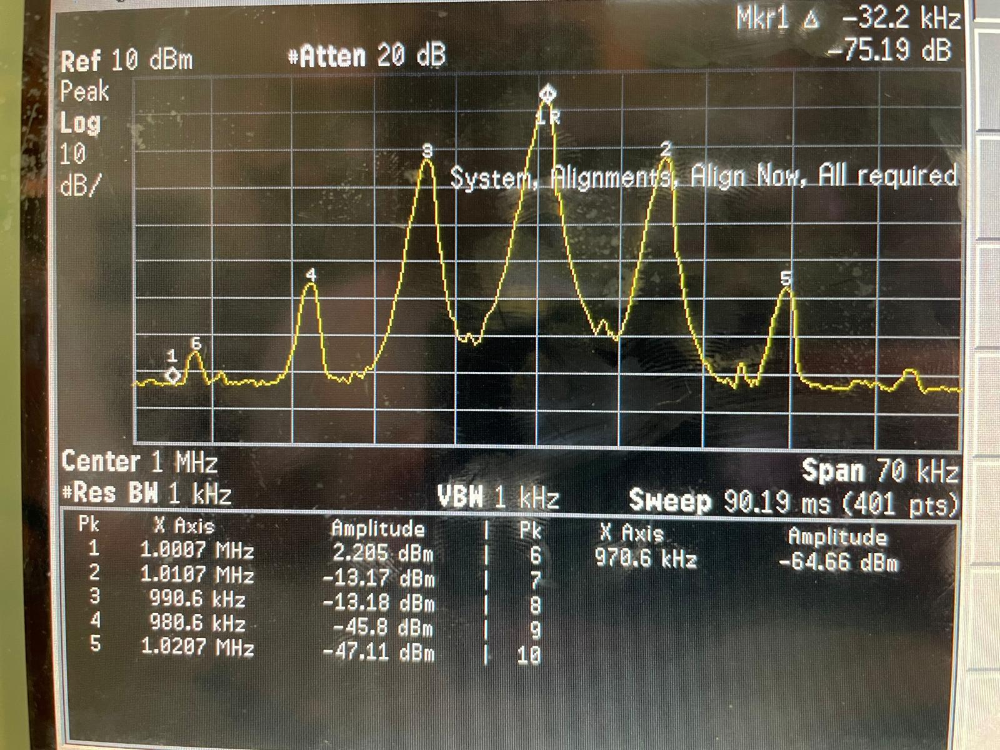  
**Figure 6.** – Spectrum analyzer display of the generated AM signal. Carrier at 1.0007 MHz with sidebands at ±10 kHz, confirming correct AM modulation.


From **Figure 6** the same procedure is done for computing the modulation depth:

In [34]:
pow_sb = -13.17       # [dB] power sideband
pow_sb = pow_sb + 6    # 6 instead of 3dB due to voltage   because val =( A_T*m)/2
pow_car = 2.2        # [dB] power carrier

sb_lin = db2pow(pow_sb / 2) # considers 20 instead 10 * log10
car = db2pow(pow_car / 2)

m = sb_lin / car

print(f"Modulation depth {m:.4f}")

Modulation depth 0.3400


We obtained a modulation depth of approximately m = 0.34. This value aligns closely with the theoretical value of 0.3 that was configured in the signal generator, and the slight deviation is attributed to measurement uncertainty, imperfect amplitude matching, and component tolerances in the analog setup.

It is also important to consider that small deviations in the measured modulation depth may be caused by spectral leakage. Since spectrum analyzers use FFT-based processing internally, energy from a frequency component can spread into adjacent bins if the signal does not align perfectly with the frequency resolution. This can slightly reduce the measured amplitudes of the carrier or sidebands, which in turn affects the calculated modulation index just as we observe from our result of m = 0.34.

### 7.1.2 Demodulation of an Amplitude-Modulated Signal

In this section, the objective is to demodulate an amplitude-modulated (AM) signal using a low-pass filter (LPF) as part of an envelope detector. The LPF is implemented as a simple RC filter, where the resistor \( R \) is fixed, and the capacitor \( C \) must be selected to ensure that the filter passes the envelope (i.e., the modulation signal) while attenuating the high-frequency carrier component.

To determine a suitable range for the capacitance C, we analyze the expected frequency content of the signal. The carrier frequency f_c and the maximum modulation frequency f_max define the bandwidth of the envelope. Using these values and the modulation index m, we calculate the corresponding angular frequencies and determine a range of suitable cutoff frequencies for the LPF. These cutoff frequencies are then used to compute the minimum and maximum required capacitance values using:

$$
C = \frac{1}{R \omega_c}
$$

where omega_c is the desired cutoff angular frequency and R is the resistance.

After calculating the valid range of capacitance values, we select a value near the middle to ensure good envelope tracking without introducing excessive delay or distortion. The selected capacitor is then used in the circuit to demodulate three different AM signals. These test signals may vary in carrier amplitude, modulation depth, or envelope shape.

For each case, we observe the output of the demodulator and verify that it successfully recovers the message signal. The results are analyzed in both the time dmain to confirm that the demodulation is effective with negligible disotrtion from the high frequency signal.

In [35]:
R       = 10e3  # [Ohm] 
f_c     = 1e6   # [Hz] carrier frequency
f_max   = 10e3  # [Hz] max modulation of the amplitude
m       = 0.3   # [] modulation depth

omega_c   = f2omega(f_c)
omega_max = f2omega(f_max)

lower_c = get_c_lpf(omega_c, R)
upper_c = get_c_lpf(omega_max, R) * 1 / m

print(f"Min. Capacitance: {scientific_2_str(lower_c, "F")}")
print(f"Max. Capacitance: {scientific_2_str(upper_c, "F")}")


c = 0.5 * upper_c

print(f"Final C Value: {scientific_2_str(c, "F")}")

Min. Capacitance: 15.9 pF
Max. Capacitance: 5.31 nF
Final C Value: 2.65 nF


To experimentally validate the selection of the capacitor C for demodulation, we simulate an envelope detector using multiple parallel RC demodulator circuits, as shown in **Figure 4**. Each demodulator uses a different capacitor value in combination with a fixed resistor of 10 kΩ. The modulated AM signal is formed by multiplying a 1 MHz carrier with a 10 kHz message, as defined by voltage sources V1 and V2. The output from this multiplication is fed into six diode-capacitor-resistor demodulator circuits, each designed to test a different C value.

The capacitor values used in the experiment are:
- 100 pF
- 500 pF
- 1 nF
- 1.6 nF
- 2 nF
- 2.5 nF

These values were selected to span a range around the theoretical ideal computed from:

$$
C = \frac{1}{R \cdot 2\pi f_c} \cdot \frac{1}{m}
$$


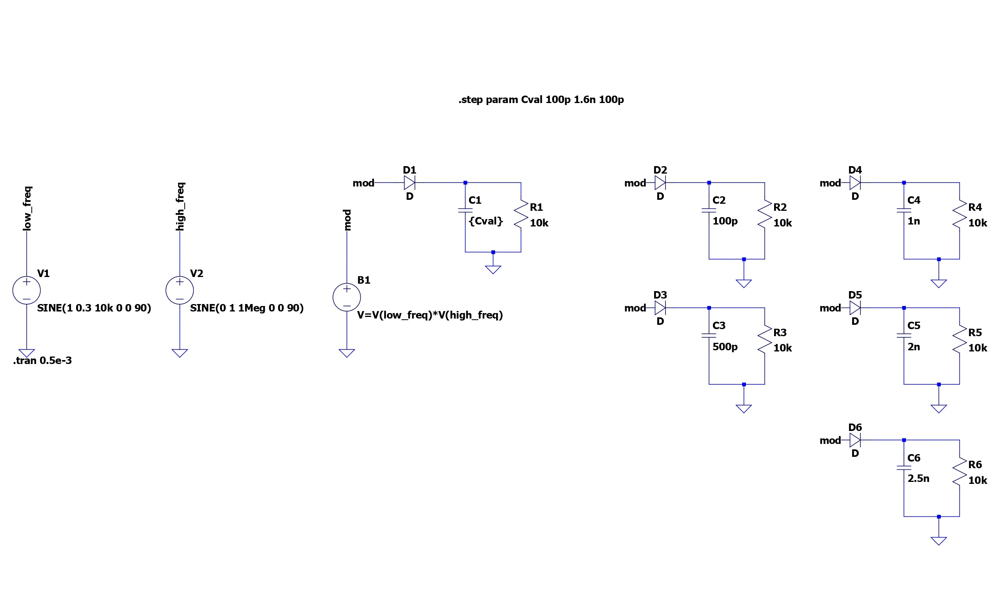  
**Figure 4.** – Circuit showing six parallel envelope detectors, each using a different capacitor value. The input AM signal is generated from two sinusoidal sources and is applied to all demodulator branches simultaneously.

By observing the output of each RC circuit in the time domain, we can identify which capacitor best recovers the original message signal. An ideal value for C should allow the envelope to track the low-frequency modulation while filtering out the high-frequency carrier ripple. The results of this experiment will guide the selection of an appropriate capacitor for reliable demodulation.

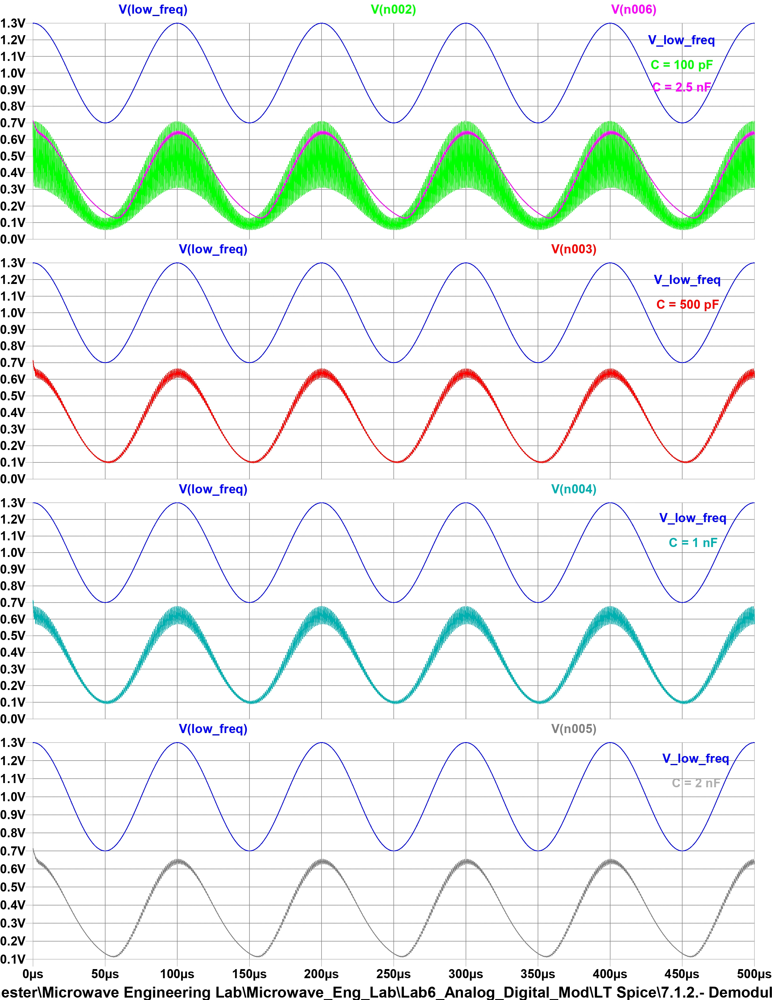  
**Figure 5.** – Time-domain output of envelope detectors for different capacitor values. 

From **Figure 5** the value of C = 2nF is selected. The sine-like waveform of the 10kHz signal remains and the jiterring of the high freqency signal is barely perceptible.

To further evaluate the performance of the envelope detector, we tested it with three different modulating signals: a sinusoidal wave, a triangular wave, and a square wave. The objective of this experiment is to assess whether the demodulation circuit correctly follows the envelope of each type of modulation and how well the RC low-pass filter reconstructs the original message signal from the modulated waveform.

In all three cases, the modulating signal is applied to a 1 MHz carrier via amplitude modulation using the multiplication method described earlier. The resulting AM signal is then passed through the diode-capacitor envelope detector configured with a capacitor of 2 nF, which was previously calculated as an appropriate value for effective demodulation.

---

### Demodulation Results

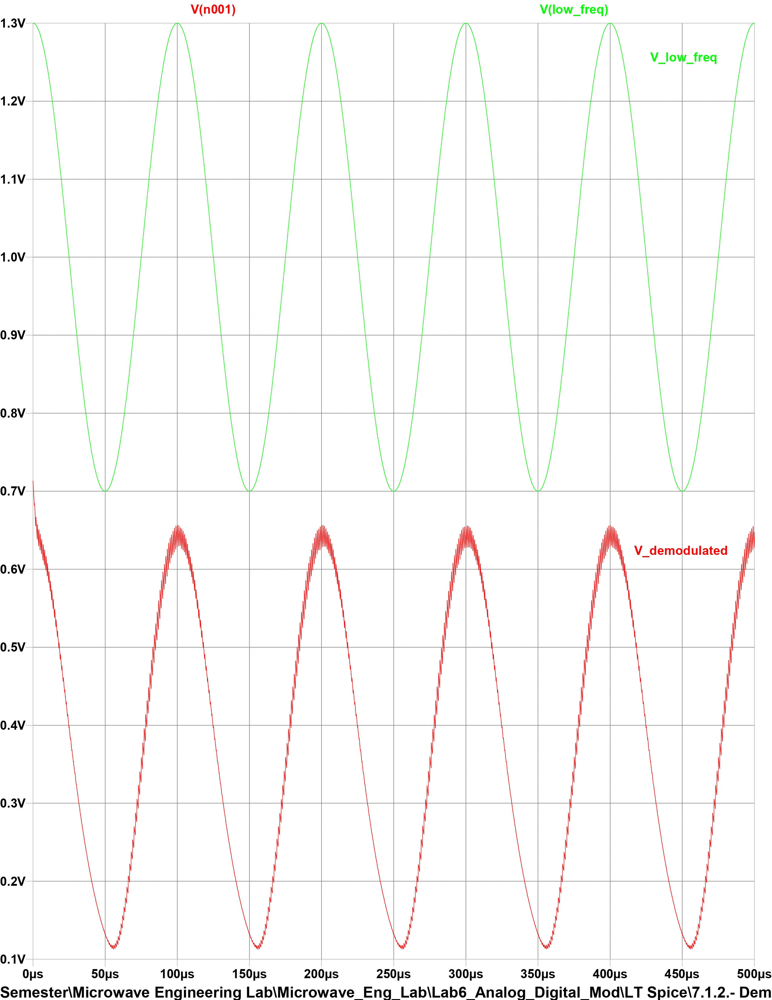
**Figure 7.** – Demodulated output for a sine wave modulating signal. The red waveform corresponds to the recovered envelope, which accurately follows the shape and amplitude of the original sinusoidal message. The result confirms that the selected \( C \) value allows proper tracking of a smooth, continuous signal.

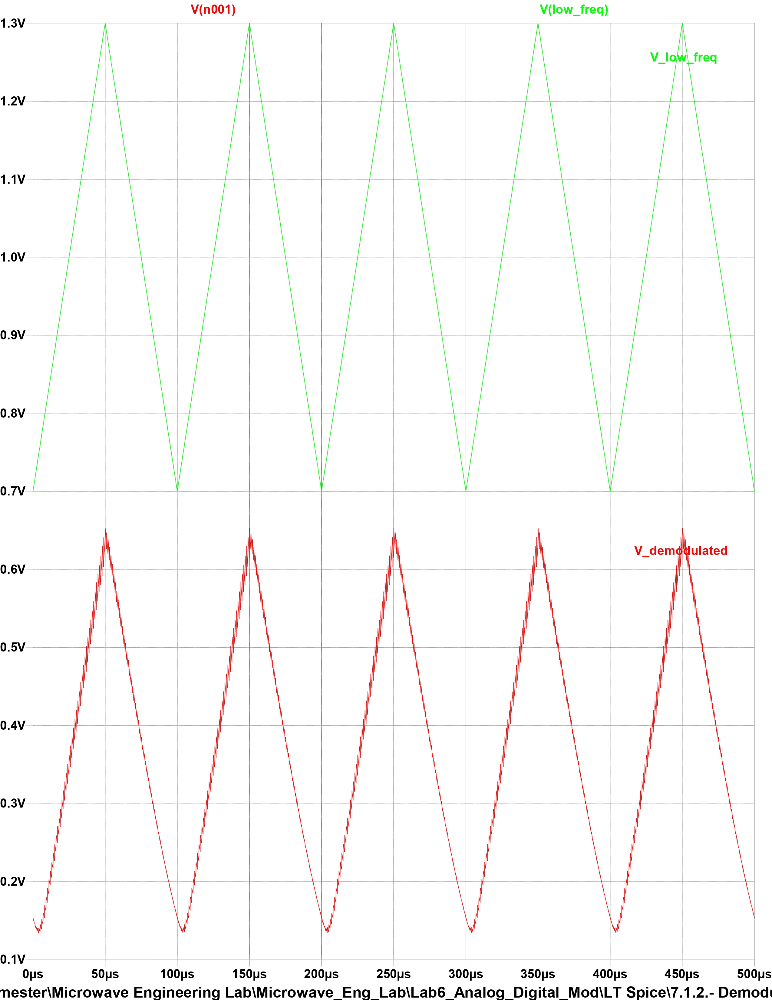
**Figure 8.** – Demodulated output for a triangular wave modulating signal. The circuit successfully follows the linear rising and falling edges of the triangle wave, with only minimal ripple or delay, indicating that the demodulator performs well even with sharper transitions in the envelope.

 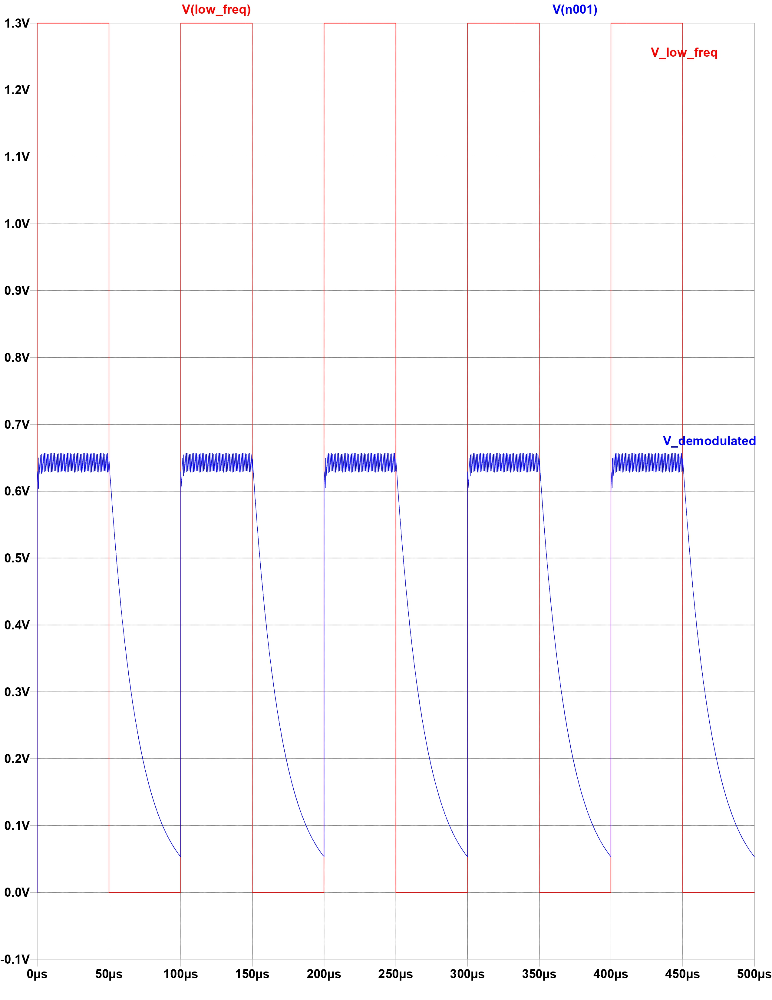
**Figure 9.** – Demodulated output for a square wave modulating signal. The envelope detector tracks the sudden step changes but introduces noticeable discharge curves between transitions due to the RC time constant. While the result is not a perfect square, it retains the correct timing and logic levels of the original waveform, demonstrating acceptable demodulation behavior for digital-like modulation.

---

These results demonstrate the effectiveness of the envelope detector across a range of signal shapes. While smooth envelopes like sine and triangle waves are reproduced with high fidelity, abrupt transitions such as those in square waves reveal the natural tradeoff between responsiveness and ripple suppression imposed by the RC filter.


### 7.1.3 – FM Demodulation via FM-AM Conversion and Envelope Detection

In this experiment, we demonstrate FM demodulation by first converting the FM signal to AM using a parallel resonant circuit, followed by envelope detection. The FM signal is generated with a 1 MHz carrier frequency, a frequency deviation of 200 kHz, and a 10 kHz modulating signal. The goal is to recover the low-frequency signal from the FM waveform.

The circuit used for this experiment is shown in **Figure 10**. The FM signal is applied to a LC circuit (L2–C2) that forms a frequency-dependent transfer function. This stage performs FM-to-AM conversion by exploiting the slope of the resonant response. The resulting AM signal is then amplified and passed through an envelope detector composed of a diode and an RC low-pass filter.

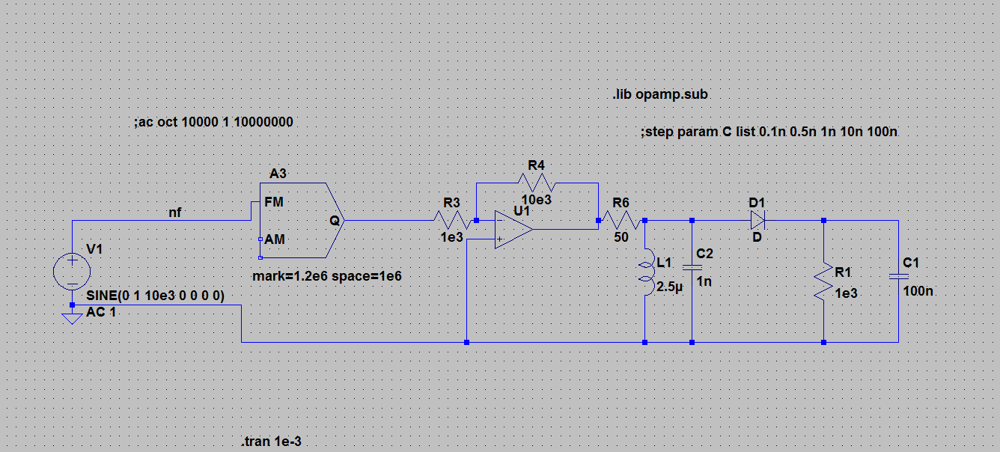
**Figure 10.** – Complete FM demodulation setup. The FM signal passes through a resonant tank circuit for FM-to-AM conversion, followed by envelope detection.

The theoretical transfer function of the LC circuit is:

$$
\underline{G}(\omega) = \frac{j \omega L_1}{j \omega L_1 + R_6 (1 - L_1 C_2 \omega^2)}
$$

This function has a resonant peak around the natural frequency of the LC circuit. Ideally, the range of frequencies generated by FM modulation should fall on the linear slope of the transfer function to allow accurate AM conversion. The expected signal after the LC circuit would also have a frequency of 10kHz after the whole demodulation process. However, with the initial values of L = 2.5 uH and C = 10 nF the observed signal is distorted. This is bevause the LC circuit needs to be adjusted to shift the operation at 1 MHz into the linear regime of the transfer function.

**Figure 11** shows the transfer function before tuning. The slope is misaligned, and the FM spectrum does not fall within the linear region.

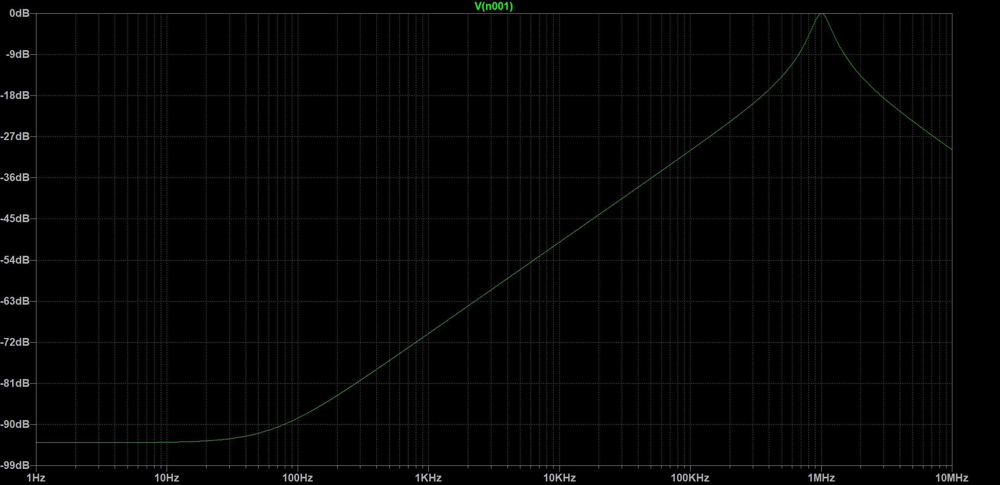
**Figure 11.** – Transfer function before tuning. The carrier and its deviation range fall outside the linear response.

After tuning component C_2 decreasing it by a factor of 10 nF from 10nF to 1nF, we shift the resonance so that the FM band is centered on the linear portion. This is visible in **Figure 11**, where the frequency response now supports proper FM-to-AM conversion.

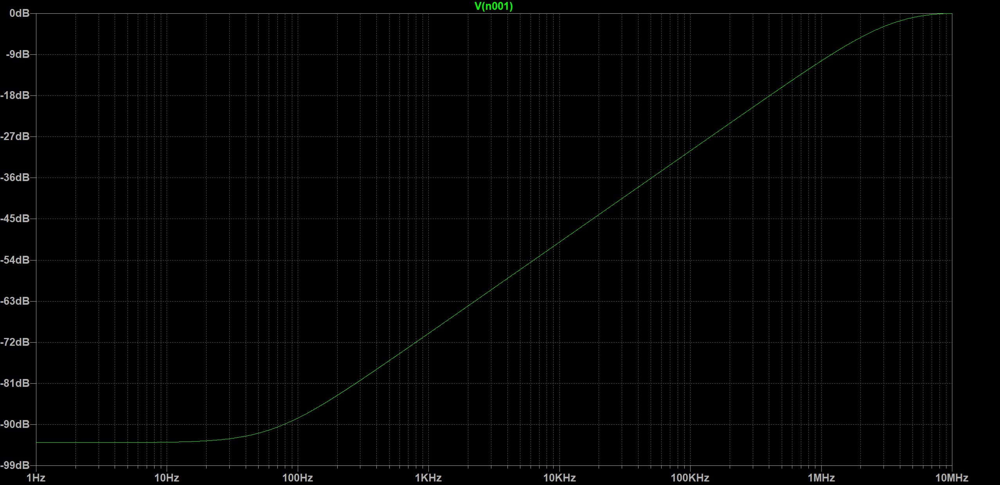
**Figure 12.** – Transfer function after tuning. The FM spectrum is now positioned along the linear slope.

We then compare the demodulated output with and without amplification. Without gain, the signal is weak having a pek to peak value of 0.1 V, as shown in **Figure 12**. The original 10 kHz signal (in blue) is barely visible in the output (in red).

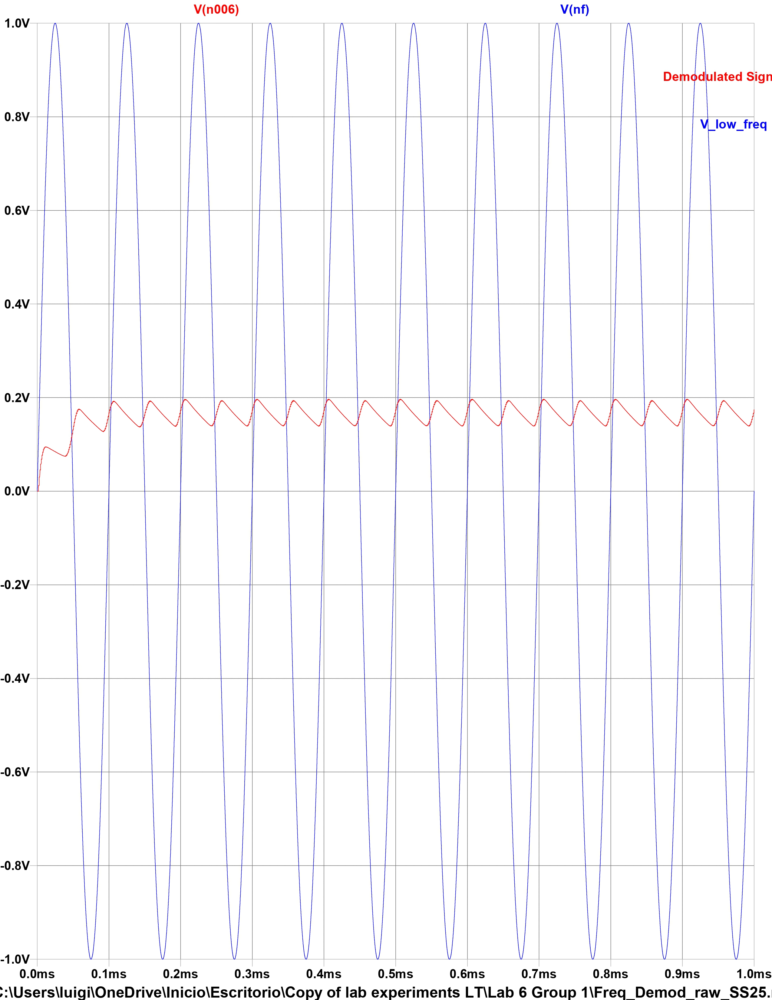
**Figure 13.** – Demodulated signal without amplification. The output is faint and noisy.

To enhance the signal, we increase the amplifier gain by adjusting resistor  R_4 from 1k Ohm to 10 kOhm . As seen in **Figure 13**, the demodulated signal now closely follows the expected shape and amplitude of the original 10 kHz modulating waveform.

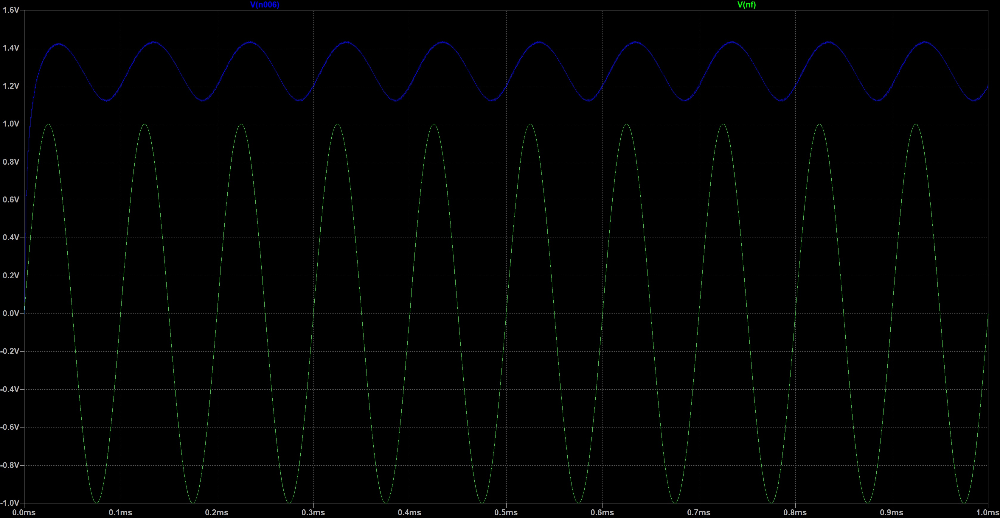
**Figure 14.** – Demodulated signal after increasing gain via  R_4 . Improved signal amplitude and fidelity.

---

### Observations

- **Expected frequency:** The modulating signal is  f_s = 10 kHz. This frequency is visible in the red demodulated output waveform, but only after tuning the transfer function and amplifying the signal.
- **Explanation:** FM-to-AM conversion requires the FM deviation band to fall within the linear slope of the transfer function. If the RC circuit is not tuned properly, the slope is too flat or too steep, leading to poor demodulation performance.
- **Amplifier role:** The amplifier improves resolution and readability of the recovered signal. Increasing R_4 increases gain of the amplifier which has a gain value of:
$$
A_v = 1 + \frac{R4}{R3}
$$
By increasing the gain of the signal we enhanced the envelope detector's ability to track and recover the original signal.


Now create a frequency-modulated signal with the signal generator.
**Look at it with the spectrum analyzer and identify the components of the received signal. <br>
Record this with pictures. Compare the characteristics of the measured spectrum to them of the theoretical one.**

Explanation: <br>
We can see in the spectra form below that the FM signal is modulated approx $\pm 200 \text{kHz}$ around the center frequency. Notable is that there are some peaks outside from this frequency band. <br>


![scope5.jpeg](Screenshots/scope5.jpeg)

For the determination of the modulation depth we took the values from the spectrum analyzer, where read off the carrier peak power and the power of the sideband peaks.
The result is close to the desired $m=0.3$, but not exact due to e.g. leakage effect and other effects.

Below the calculation of the modulation depth from measured values and a picture of an example spectrum from our measurement (values do not match to the calculation).

In [36]:
pow_sb = -19.69        # [dB] power sideband
pow_sb = pow_sb + 6    # 6 instead of 3dB due to voltage
pow_car = -3.22        # [dB] power carrier

sb_lin = db2pow(pow_sb / 2) # considers 20 instead 10 * log10
car = db2pow(pow_car / 2)

m = sb_lin / car

print(f"Modulation depth {m:.4f}")

Modulation depth 0.2996


## 7.2 Digital Demodulation

The following settings were used:
- $ f_c = 800 \text{MHz} $
- $ P_{LO} = 10 \text{dBm} $ for the first signal generator (R%S in the script)
- $ P_{RF} = 0 \text{dBm}$ for the second signal generator (Agilent in the script)

**Which form of the IQ signals would you expect?**

Expectation: <br>
The expectation would be to see on each oscilloscope channel complementary binary values.

Think about how the modulated transmit
signal looks like. In addition, think about what an IQ demodulator does or how it is constructed.<br>
**Why could it be that the displayed IQ signals deviate from theory? What could help?**

IQ demodulator: <br>
- Splits signal in two
- mixes one branch (I) with the LO signal
- mixes the other (Q) with a 90° shifted signal
- Both branches get filtered to reduce alias effects

The deviation from the expectation is due to the fact that the RF signal (simulates signal from an antenna/TX) is not syncronized with the LO signal, which simulates the LO of a receiver. So the fix would be to syncronize the PLLs of our lab equipment, which can be done by hooking up the trigger of one signal generator to the other. <br>
In a constellation diagram the points would rotate equidistant around the center. 

![title](Screenshots/scope_0.png)

**Reconstruct the information signal according to (5.5) from the script (Calculate the
amplitude of the received signal. Take a photo or save a picture of the displayed signals.).**

In [37]:
s_i = 48e-3     # [V] 
s_q = 225e-3    # [V]
a = np.sqrt(np.pow(s_i, 2) + np.pow(s_q, 2))

print(f"Amplitude of the received signal {scientific_2_str(a, "V")}")

Amplitude of the received signal 230 mV


![title](Screenshots/scope_1.png)

**Explain why the I and Q signals changed after the LO frequency had been changed and
restored.**

Because the position of I and Q is only relative to each other, they can also be represented by a mirrowed or a shifted position (as in the angle towards the I and Q axis) in the constellation diagram. <br>
As shown below the amplitude is still the same.

In [38]:
s_i = 229e-3     # [V] 
s_q = 78e-3      # [V]
a = np.sqrt(np.pow(s_i, 2) + np.pow(s_q, 2))

print(f"Amplitude of the received signal {scientific_2_str(a, "V")}")

Amplitude of the received signal 242 mV


![title](Screenshots/scope_2.png)

The LO of the two devices are now synchronized, but he constellation diagramm can still change after restoring the LO frequency, since the "startup" phase is not synchronized and will vary with each time it will be restored, but stays fix then.



